# Data Mining Project

## Data Analysis on a House Renting Application in Athens

**Editors:**

Anastasios Bazinis - 1115201500099 

Grigorios Katrakazas - 1115201600063

## Prepreparation

**1)** Import libraries and packages

In [1]:
from pandas import DataFrame, read_csv
import nltk
import folium
from folium import plugins


import numpy as np
from wordcloud import WordCloud, STOPWORDS
from collections import Counter
from nltk.tokenize.stanford import StanfordTokenizer
from nltk.tokenize import RegexpTokenizer, word_tokenize,WordPunctTokenizer
from nltk.corpus import stopwords
from nltk.collocations import BigramCollocationFinder,BigramAssocMeasures

from sklearn.feature_extraction.text import TfidfVectorizer

import matplotlib.pyplot as plt
import pandas as pd #this is how I usually import pandas
import sys #only needed to determine Python version number
import matplotlib #only needed to determine Matplotlib version number
import os,glob
from sklearn.metrics.pairwise import cosine_similarity,linear_kernel

# Enable inline plotting
%matplotlib inline

In [2]:
print('Python version ' + sys.version)
print('Pandas version ' + pd.__version__)
print('Matplotlib version ' + matplotlib.__version__)

Python version 3.8.2 (v3.8.2:7b3ab5921f, Feb 24 2020, 17:52:18) 
[Clang 6.0 (clang-600.0.57)]
Pandas version 1.0.3
Matplotlib version 3.2.1


**2)** Read csv files and get the columns we will need

In [5]:
#read files

d1 = r'../Desktop/data/april/listings.csv'
apr= pd.read_csv(d1,usecols=['id','zipcode','transit','bedrooms','beds','review_scores_rating','number_of_reviews','neighbourhood','name','latitude','longitude','last_review','instant_bookable','host_since','host_response_rate','host_identity_verified','host_has_profile_pic','first_review','description','city','cancellation_policy','bed_type','bathrooms','accommodates','amenities','room_type','property_type','price','availability_365','minimum_nights'])
d2 = r'../Desktop/data/febrouary/listings.csv'
feb= pd.read_csv(d2,usecols=['id','zipcode','transit','bedrooms','beds','review_scores_rating','number_of_reviews','neighbourhood','name','latitude','longitude','last_review','instant_bookable','host_since','host_response_rate','host_identity_verified','host_has_profile_pic','first_review','description','city','cancellation_policy','bed_type','bathrooms','accommodates','amenities','room_type','property_type','price','availability_365','minimum_nights'])
d3 = r'../Desktop/data/march/listings.csv'
mar= pd.read_csv(d3,usecols=['id','zipcode','transit','bedrooms','beds','review_scores_rating','number_of_reviews','neighbourhood','name','latitude','longitude','last_review','instant_bookable','host_since','host_response_rate','host_identity_verified','host_has_profile_pic','first_review','description','city','cancellation_policy','bed_type','bathrooms','accommodates','amenities','room_type','property_type','price','availability_365','minimum_nights'])

apr.insert(0, "month", "apr") 
feb.insert(0, "month", "feb")
mar.insert(0, "month", "mar")

In [6]:
#convert to csv

df=pd.DataFrame(data=apr)
df.to_csv('d_apr.csv',encoding='utf-8',index=False)
df=pd.DataFrame(data=feb)
df.to_csv('d_feb.csv',encoding='utf-8',index=False)
df=pd.DataFrame(data=mar)
df.to_csv('d_mar.csv',encoding='utf-8',index=False)


**3)** Make a new csv that includes the data for February, March and Arpil

In [7]:
#concatenate 

path="../Desktop/"
all_files = glob.glob(os.path.join(path, "d_*.csv"))
df_from_each_file = (pd.read_csv(f, sep=',') for f in all_files)
df_merged   = pd.concat(df_from_each_file, ignore_index=True)
df_merged.to_csv("train.csv",index = False)


**4)** Drop rows that have null cells in columns (id,name,neighbourhood,city,bedrooms,description)

In [8]:
#drop rows that are null

res=pd.read_csv('train.csv')
res=res.dropna(subset=['id','name','neighbourhood','city','bedrooms','description'])
res.to_csv('train.csv',encoding='utf-8',index=False)

**5)** Fill nulls with appropriate data

In [9]:
#fill nulls

tr = pd.read_csv('train.csv')
tr["host_since"].fillna("0000-00-00", inplace = True) 
tr["host_response_rate"].fillna("-1", inplace = True)
tr["host_has_profile_pic"].fillna("f", inplace = True)
tr["host_identity_verified"].fillna("f", inplace = True)
tr["transit"].fillna("No info", inplace = True)
tr["zipcode"].fillna("00000", inplace = True)
tr["beds"].fillna("No info", inplace = True)
tr["bed_type"].fillna("No info", inplace = True)
tr.to_csv('train.csv',encoding='utf-8',index=False)
tr.loc[tr['number_of_reviews'] == 0,'review_scores_rating'] = -1.0
tr.loc[tr['number_of_reviews'] == 0,'first_review'] = '0000-00-00'
tr.loc[tr['number_of_reviews'] == 0,'last_review'] = '0000-00-00'
tr["review_scores_rating"].fillna(0.0, inplace = True)
tr.to_csv('train.csv',encoding='utf-8',index=False)

**6)** Fix wrong types and wrong values in cells

In [10]:
#remove $ from price

tr['price'] = tr['price'].replace('[\$,]', '', regex=True).astype(float)
tr['host_response_rate'] = tr['host_response_rate'].replace('[\%,]', '', regex=True).astype(float)

tr['zipcode']= tr['zipcode'].replace('[\ ,.]', '', regex=True).astype(str)
for i in range(len(tr)):
    ss=tr['zipcode'][i]
    if len(ss)>5:
        tr=tr.drop([i])
    
tr.to_csv('train.csv',encoding='utf-8',index=False)

## Data Analysis

### 1) The most popular room_type

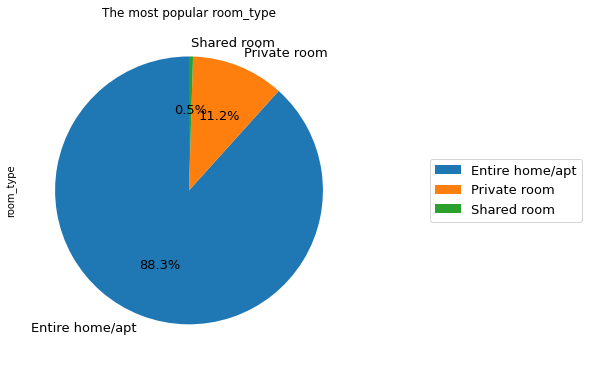

In [11]:
#1.1

#print("The most popular room_type is: ",tr['room_type'].value_counts().idxmax())
dd=pd.DataFrame(data=tr['room_type'].value_counts())

ax=dd.plot.pie(y='room_type',figsize=(6,8),autopct='%1.1f%%', startangle=90,fontsize=13)
ax.set_title("The most popular room_type")
ax.legend(loc="center left",bbox_to_anchor=(1.2, 0, 0.5, 1),fontsize=13)

#dd.plot.bar(title='The most popular room_type',rot=15,figsize=(13, 7),fontsize=12)
plt.show()

### 2) Average price for each month

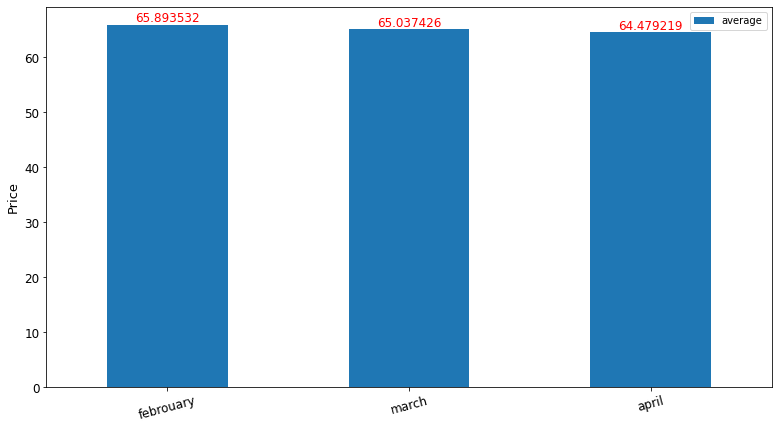

In [12]:
#1.2

m1=tr[tr['month']=='feb']['price'].mean()
m2=tr[tr['month']=='mar']['price'].mean()
m3=tr[tr['month']=='apr']['price'].mean()

m={'month':['febrouary','march','april'],'average':[m1,m2,m3]}

dm=DataFrame(m,columns=['month','average'])
ax=dm.plot(x ='month', y='average', kind = 'bar',rot=15,figsize=(13, 7),fontsize=12)

for p in ax.patches:
    ax.text(p.get_x() + p.get_width()/2., p.get_height(), '%f' % float(p.get_height()), 
            fontsize=12, color='red', ha='center', va='bottom')
plt.ylabel('Price',fontsize=13)
plt.xlabel('')
plt.show()


### 3) The top 5 neighbourhoods with the most reviews

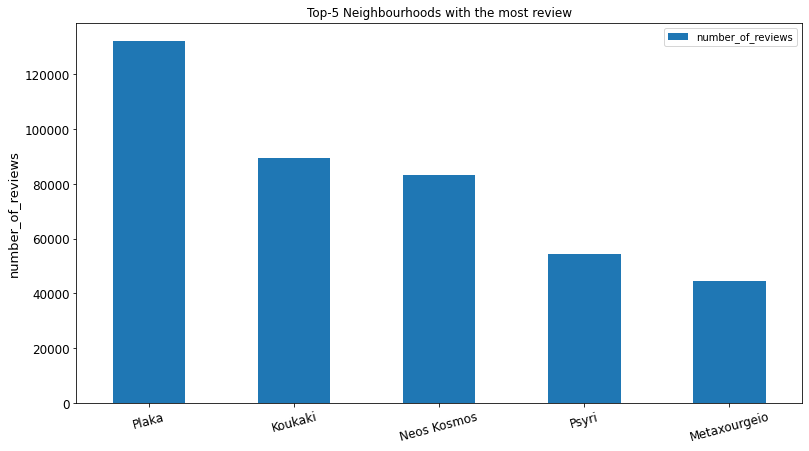

In [13]:
#1.3

dd=tr.groupby(['neighbourhood'])['number_of_reviews'].agg('sum').sort_values(ascending = False).head(5)
dd=pd.DataFrame(dd)

dd.plot.bar(title='Top-5 Neighbourhoods with the most review',rot=15,figsize=(13, 7),fontsize=12)
plt.ylabel('number_of_reviews',fontsize=13)
plt.xlabel('')
plt.show()


### 4) The neighbourhood with the most house registrations

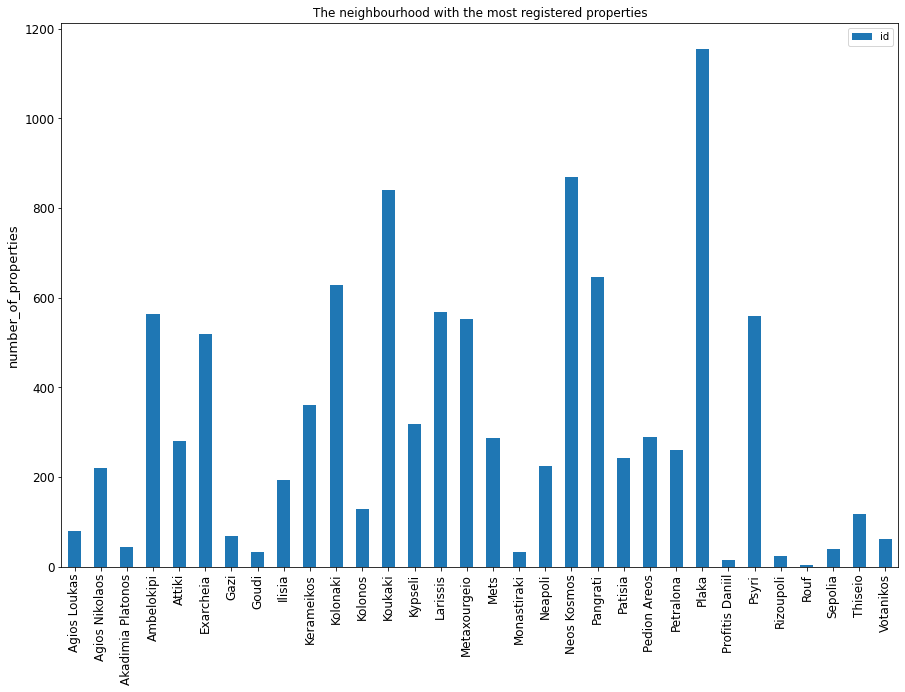

In [14]:
#1.4

n = tr.drop_duplicates(subset = 'id')
#print("The neighbourhood with the most registered properties is:",n.groupby(['neighbourhood'])['id'].agg('count').idxmax())
dd=n.groupby(['neighbourhood'])['id'].agg('count')
dd=pd.DataFrame(dd)

dd.plot.bar(title='The neighbourhood with the most registered properties',rot=90,figsize=(15, 10),fontsize=12)
plt.ylabel('number_of_properties',fontsize=13)
plt.xlabel('')
plt.show()

### 5) House registrations per month and per neighbourhood 

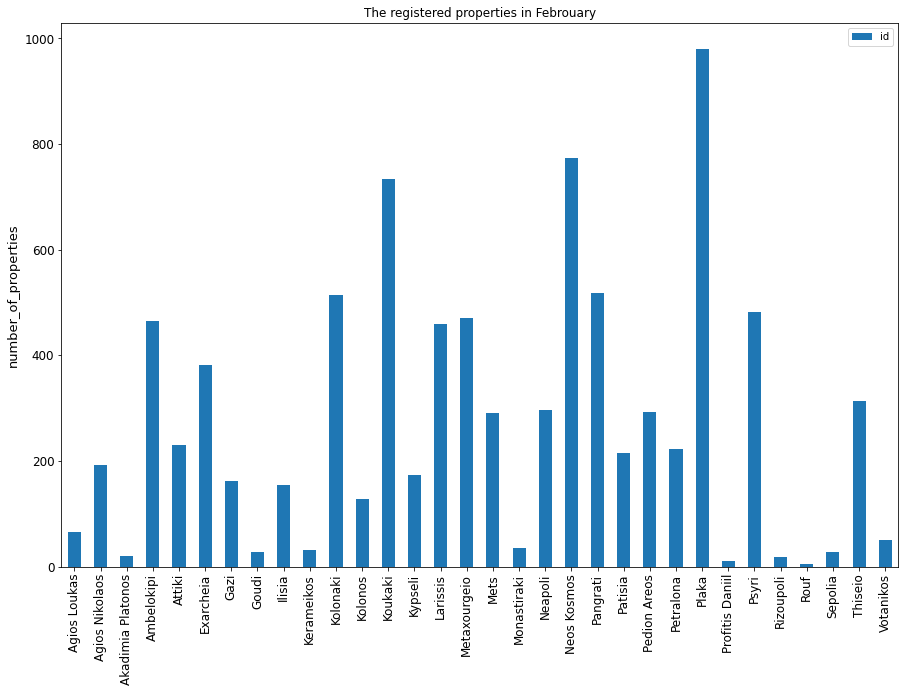

In [15]:
#1.5 Feb

febr = tr[tr['month']=='feb']
f = febr.groupby(['neighbourhood'])['id'].agg('count')
#print("\033[1m"+"February\n\n"+"\033[0m",f)
dd=DataFrame(f)

dd.plot.bar(title='The registered properties in Febrouary',rot=90,figsize=(15, 10),fontsize=12)
plt.ylabel('number_of_properties',fontsize=13)
plt.xlabel('')
plt.show()


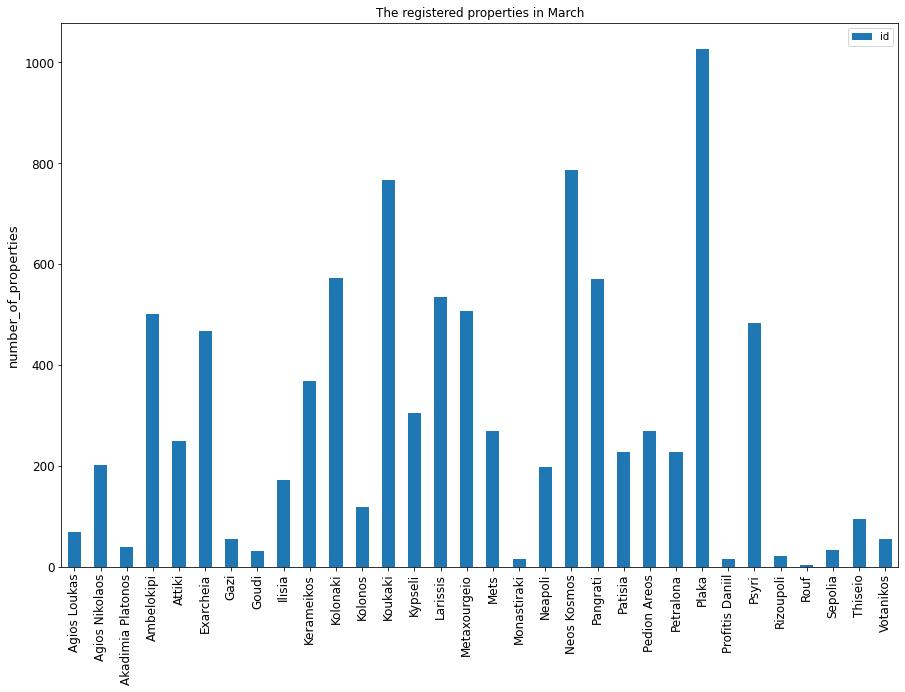

In [16]:
#1.5 Mar

march = tr[tr['month']=='mar']
m = march.groupby(['neighbourhood'])['id'].agg('count')
dd=DataFrame(m)

dd.plot.bar(title='The registered properties in March',rot=90,figsize=(15, 10),fontsize=12)
plt.ylabel('number_of_properties',fontsize=13)
plt.xlabel('')
plt.show()


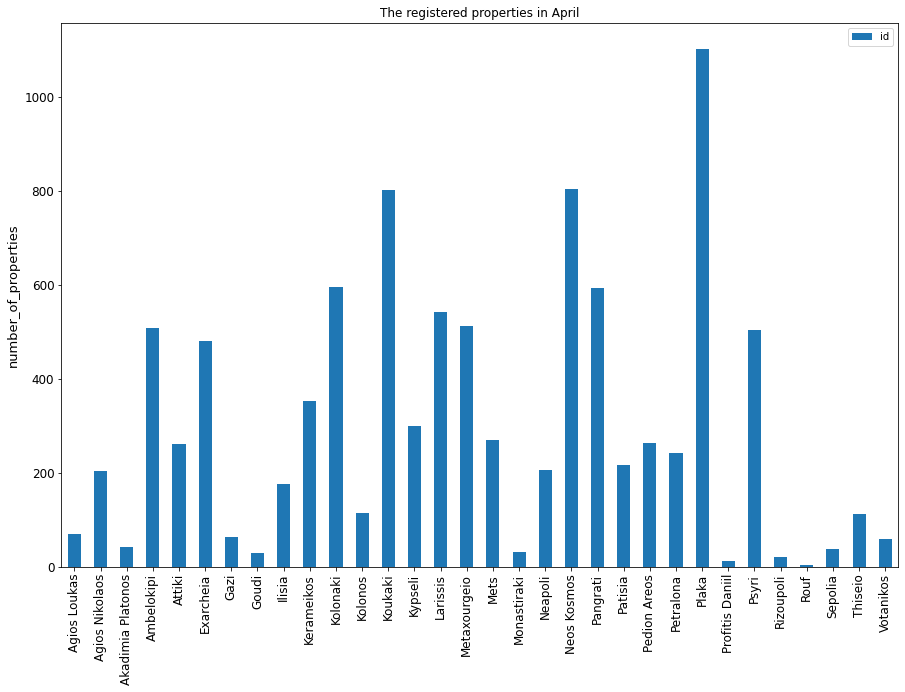

In [17]:
#1.5 Apr

apr = tr[tr['month']=='apr']
a = apr.groupby(['neighbourhood'])['id'].agg('count')
dd=DataFrame(a)

dd.plot.bar(title='The registered properties in April',rot=90,figsize=(15, 10),fontsize=12)
plt.ylabel('number_of_properties',fontsize=13)
plt.xlabel('')
plt.show()

### 6) Histogram for the variable neighbourhood

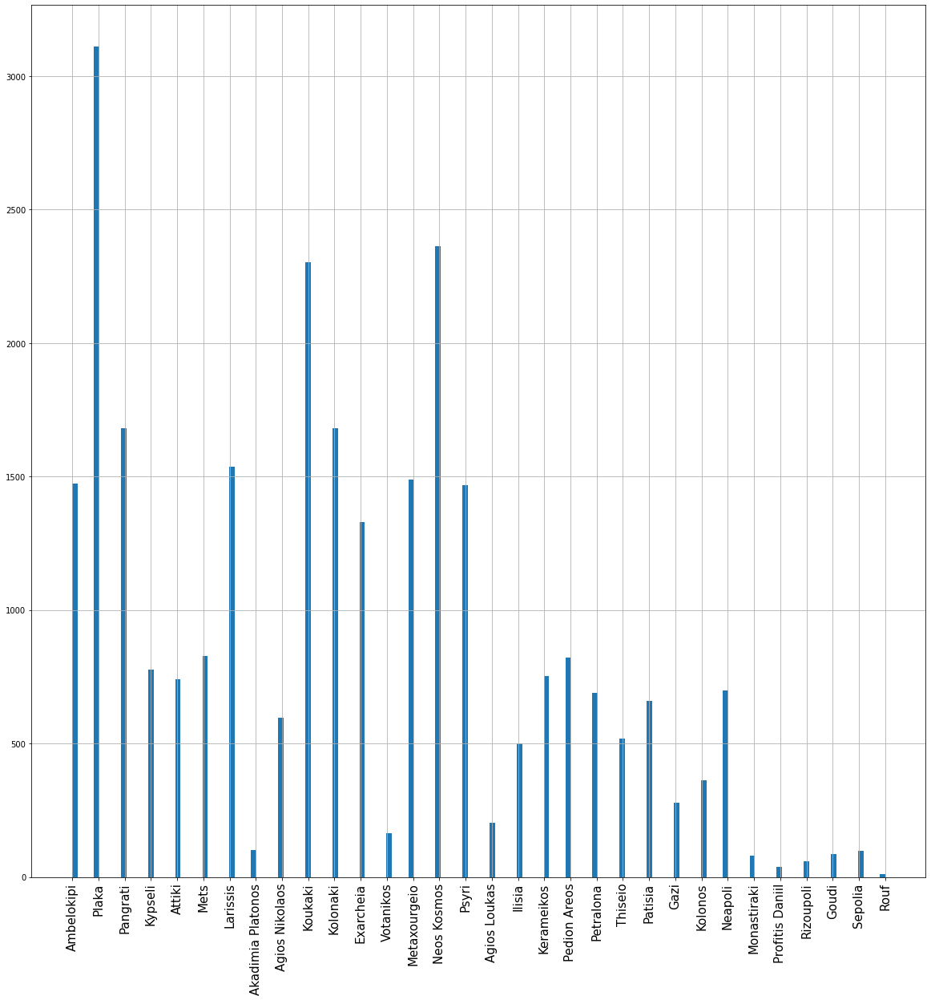

In [18]:
#1.6

h = tr['neighbourhood']
h = h.hist(bins=150,figsize=(20,20),xrot = 90,xlabelsize=15)


### 7) The most frequent room type per neighbourhood

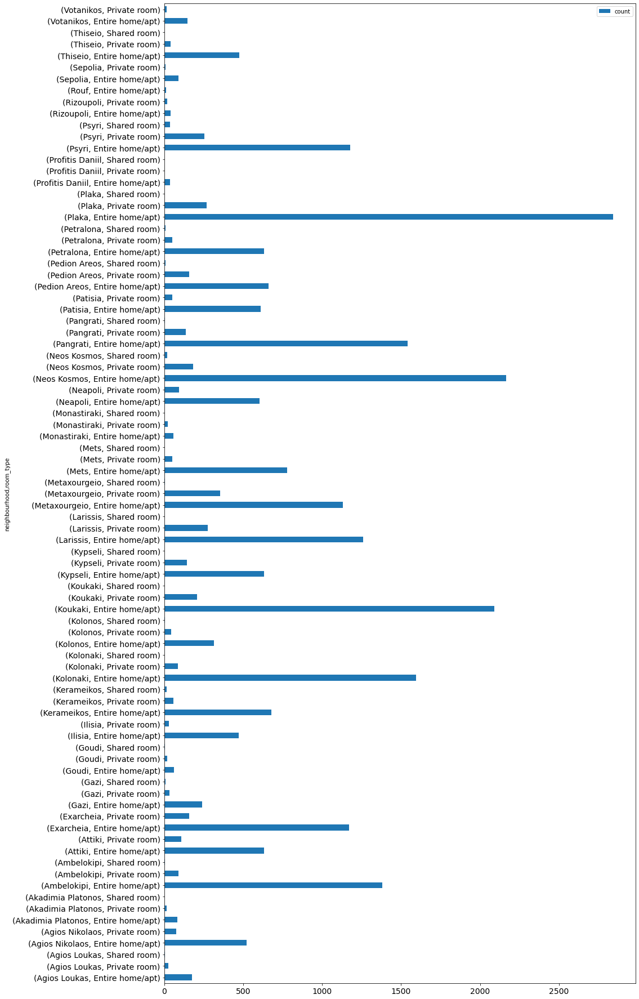

In [19]:
#1.7

dd = tr.groupby(['neighbourhood','room_type'])['room_type'].size()
dd=pd.DataFrame(dd)
dd=dd.rename(columns={"room_type": "count"})

ax=dd.plot.barh(figsize=(15, 32),y='count',fontsize=14)
plt.show()


### 8) The most expensive room type

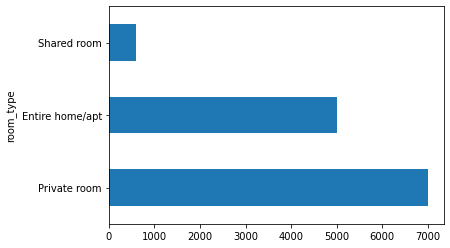

In [20]:
#1.8

trr = tr.groupby(['room_type'])['price'].max()
#print(trr.sort_values(ascending = False).head(1))
trr=trr.sort_values(ascending = False)
trr
trr.plot.barh()
plt.show()

### 9) Map of every registered house in the month of february

In [21]:
#1.9

m = folium.Map([37.98888,23.76431], zoom_start=15)
for index, row in tr[tr['month'] == 'feb'].iterrows():
    folium.CircleMarker([row['latitude'], row['longitude']],
                        radius=6,
                        popup=row[['id','zipcode']].to_string(),
                        fill_color='blue'
                       ).add_to(m)
m

### 10.1) WordCloud for the variable neighbourhood

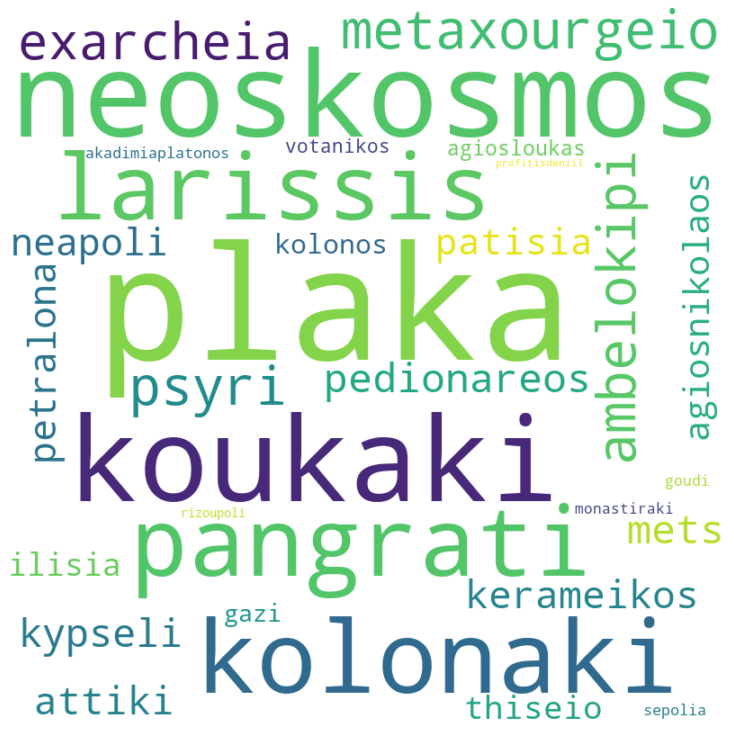

In [22]:
#1.10 neighbourhood

lowercase = []
clean_words = []
clean_words_str = []
tokenizer = WordPunctTokenizer()
for word in tr['neighbourhood']:
    word = word.replace(" ","")
    lowercase.append(tokenizer.tokenize(word.lower()))

stop_words = set(stopwords.words('english'))

i=0
for x in range(0,len(lowercase)):
    
    clean_words.append([token for token in lowercase[x] if not token in stop_words and token.isalpha()])
    clean_words_str.append(" ".join(clean_words[i]))
    i+=1

total = Counter()
for i in clean_words[0:]:
        total.update(i)
        

dict(total)
 
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                min_font_size = 10).generate_from_frequencies(total)
  
# plot the WordCloud image
plt.figure(figsize = (15, 10), facecolor = None) 
plt.imshow(wordcloud,interpolation='bilinear') 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show()



### 10.2) WordCloud for the variable transit

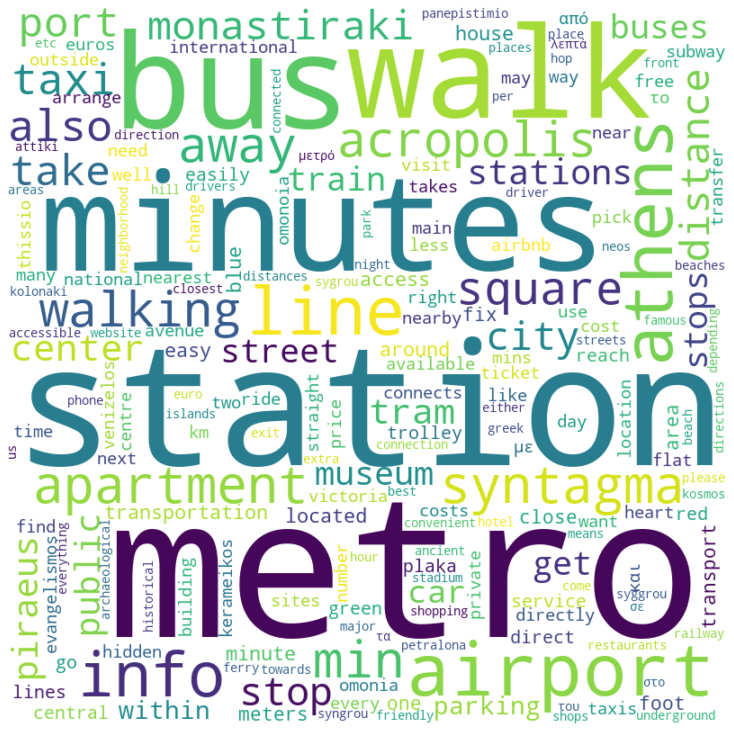

In [23]:
#1.10 transit

lowercase = []
clean_words = []
clean_words_str = []
tokenizer = WordPunctTokenizer()
for word in tr['transit']:
    lowercase.append(tokenizer.tokenize(word.lower()))

stop_words = set(stopwords.words('english'))

i=0
for x in range(0,len(lowercase)):
    
    clean_words.append([token for token in lowercase[x] if not token in stop_words and token.isalpha()])
    clean_words_str.append(" ".join(clean_words[i]))
    i+=1

total = Counter()
for i in clean_words[0:]:
        total.update(i)
        

dict(total)
 
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                min_font_size = 10).generate_from_frequencies(total)
  
# plot the WordCloud image
plt.figure(figsize = (15, 10), facecolor = None) 
plt.imshow(wordcloud,interpolation='bilinear') 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show()



### 10.3) WordCloud for the variable description

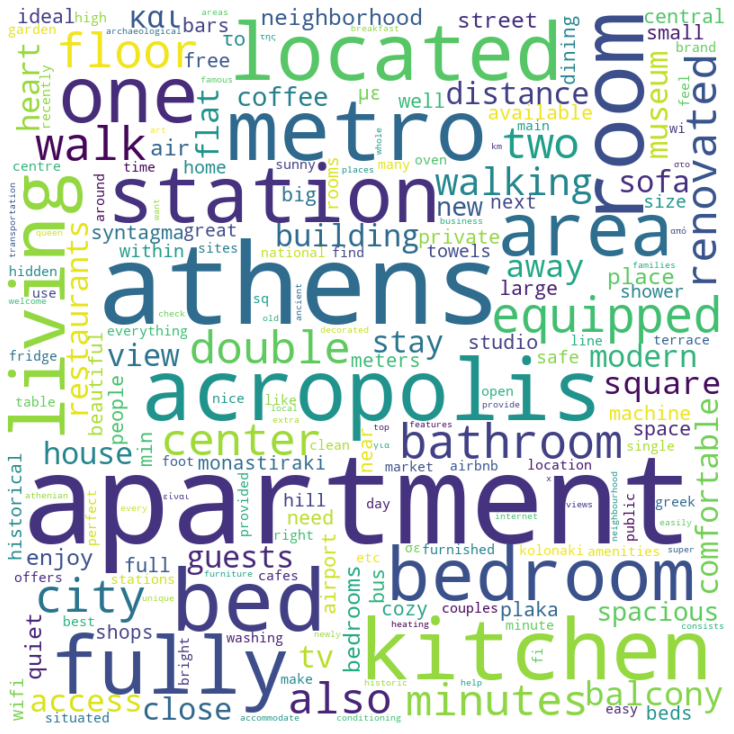

In [24]:
#1.10 description

lowercase = []
clean_words = []
clean_words_str = []
tokenizer = WordPunctTokenizer()
for word in tr['description']:
    lowercase.append(tokenizer.tokenize(word.lower()))


i=0
for x in range(0,len(lowercase)):
    clean_words.append([token for token in lowercase[x] if not token in stop_words and token.isalpha()])
    clean_words_str.append(" ".join(clean_words[i]))
    i+=1

total = Counter()
for i in clean_words[0:]:
        total.update(i)
        

dict(total)
 
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white',
                min_font_size = 10).generate_from_frequencies(total)
  
# plot the WordCloud image
plt.figure(figsize = (15, 10), facecolor = None) 
plt.imshow(wordcloud,interpolation='bilinear') 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show()

### 10.4) WordCloud for the variable last_review

**1)** loading data from reviews.csv 

In [25]:

r1 = r'../Desktop/data/april/reviews.csv'
rapr= pd.read_csv(r1,usecols=['listing_id','date','comments'])
r2 = r'../Desktop/data/febrouary/reviews.csv'
rfeb= pd.read_csv(r2,usecols=['listing_id','date','comments'])
r3 = r'../Desktop/data/march/reviews.csv'
rmar= pd.read_csv(r3,usecols=['listing_id','date','comments'])

rapr.insert(0, "month", "apr") 
rfeb.insert(0, "month", "feb")
rmar.insert(0, "month", "mar")


**2)** create a csv for each month 

In [26]:
df=pd.DataFrame(data=rapr)
df.to_csv('r_apr.csv',encoding='utf-8',index=False)
df=pd.DataFrame(data=rfeb)
df.to_csv('r_feb.csv',encoding='utf-8',index=False)
df=pd.DataFrame(data=rmar)
df.to_csv('r_mar.csv',encoding='utf-8',index=False)

**3)** concatenate 

In [28]:
path="../Desktop/"
all_files = glob.glob(os.path.join(path, "r_*.csv"))
df_from_each_file = (pd.read_csv(f, sep=',') for f in all_files)
df_merged   = pd.concat(df_from_each_file, ignore_index=True)
df_merged.to_csv("rev.csv",index = False)

re=pd.read_csv('rev.csv')


**4)** store rows with the most recent date  

In [29]:
group_cols = ['month', 'listing_id']
metric_cols = ['date']

aggs = re.groupby(group_cols)[metric_cols].max()

In [30]:

re = re.sort_values('date',ascending=False).drop_duplicates(group_cols, keep='last')
re.drop(metric_cols, axis=1, inplace=True)
#re.drop_duplicates(subset=group_cols, keep='last', inplace=True)

re = re.merge(right=aggs, right_index=True, left_on=group_cols, how='right')
re = pd.DataFrame(re)
re = re.reset_index(drop=True)
re.drop_duplicates(['listing_id','comments','date'],inplace=True)
re = re.reset_index(drop=True)


**5)** creating word cloud for comments 

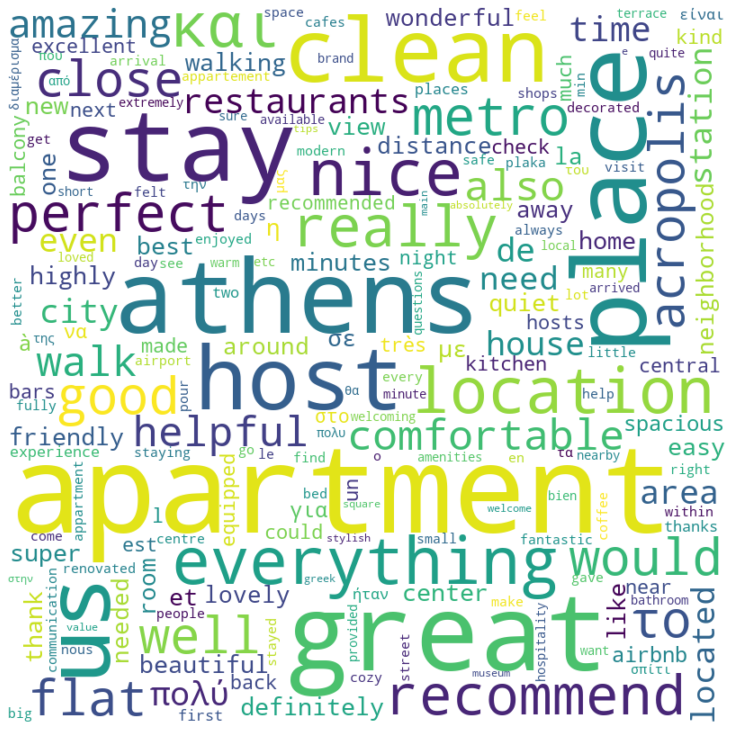

In [31]:
#1.10 last_review

lowercase = []
clean_words = []
clean_words_str = []
tokenizer = WordPunctTokenizer()

for word in re['comments']:
    word=str(word)
    lowercase.append(tokenizer.tokenize(word.lower()))

stop_words = set(stopwords.words('english'))

i=0
for x in range(0,len(lowercase)):
    clean_words.append([token for token in lowercase[x] if not token in stop_words and token.isalpha()])
    clean_words_str.append(" ".join(clean_words[i]))
    i+=1

total = Counter()
for i in clean_words[0:]:
        total.update(i)
        

dict(total)
 
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white',
                min_font_size = 10).generate_from_frequencies(total)
  
# plot the WordCloud image
plt.figure(figsize = (15, 10), facecolor = None) 
plt.imshow(wordcloud,interpolation='bilinear') 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show()

### 11) What is the Top-5 most expensive zipcodes ?

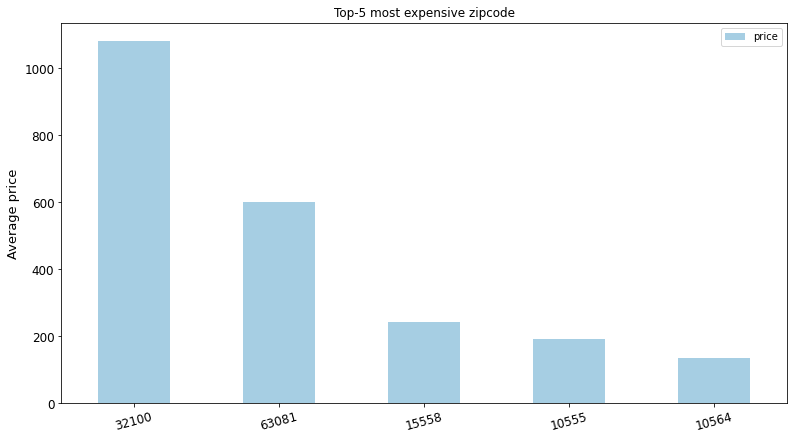

In [32]:
#1.12

dd = tr.groupby(['zipcode'])['price'].mean().reset_index(level='zipcode')

for i in range(len(dd)):
    ss=dd['zipcode'][i]
    if str(ss)=='00000':
        dd=dd.drop([i])
dd=dd.sort_values(by='price',ascending = False)
dd=dd.head(5)

dd.plot.bar(title='Top-5 most expensive zipcode',x='zipcode',rot=15,figsize=(13, 7),fontsize=12,colormap='Paired')
plt.ylabel('Average price',fontsize=13)
plt.xlabel('')
plt.show()

### 12) Cancellation_policy for houses with rating over 90% and reviews over 100

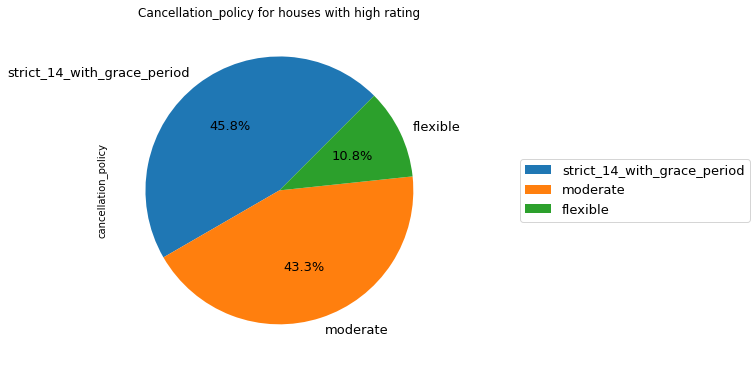

In [33]:
#1.12

temp=tr[tr['review_scores_rating']>=90.0 ]
temp=temp[temp['number_of_reviews']>=100 ]
temp.reset_index(drop=True)
temp=pd.DataFrame(temp)
temp=temp['cancellation_policy'].value_counts()
ax=temp.plot.pie(y='cancellation_policy',figsize=(6,8),autopct='%1.1f%%', startangle=45,fontsize=13)
ax.set_title("Cancellation_policy for houses with high rating")
ax.legend(loc="center left",bbox_to_anchor=(1.2, 0, 0.5, 1),fontsize=13)
plt.show()

## Recommendation System

### Prepreparation

- Keep the id the name and the description of every house
- Insert a new column with the concatenated values of the columns name and description

In [34]:
#3

rs = tr[['id','name','description']]
rs = rs.reset_index(drop=True)
rs.to_csv('rec_sys.csv',index = False)
rs['concatenation'] = rs[['name', 'description']].astype(str).apply(lambda x: ' '.join(x), axis = 1)

- The wordcloud of the new column

In [35]:
lowercase = []
clean_words = []
clean_words_str = []
tokenizer = WordPunctTokenizer()
rs=rs.drop_duplicates(subset = 'id')
for word in rs['concatenation']:  
    lowercase.append(tokenizer.tokenize(word.lower()))

stop_words = set(stopwords.words('english'))

i=0
for x in range(0,len(lowercase)):
    clean_words.append([token for token in lowercase[x] if not token in stop_words and token.isalpha()])
    clean_words_str.append(" ".join(clean_words[i]))
    i+=1
#total = Counter()
#for i in clean_words[0:]:
#    total.update(i)
        
#dict(total)

#wordcloud = WordCloud(width = 800, height = 800, 
#                background_color ='white', 
#                stopwords = stopwords,
#                min_font_size = 10).generate_from_frequencies(total)
#  

#plt.figure(figsize = (15, 10), facecolor = None) 
#plt.imshow(wordcloud,interpolation='bilinear') 
#plt.axis("off") 
#plt.tight_layout(pad = 0) 
  
#plt.show()



### 1) TF-IDF array

In [36]:
#3.1

rs = rs.reset_index(drop=True)
vectorizer = TfidfVectorizer(stop_words='english',ngram_range=(1,2)) 
tfidf = vectorizer.fit_transform(clean_words_str)


### 2) Cosine Similarity

In [37]:
#3.2

tfidf=tfidf.astype(np.float32)
similar = linear_kernel(tfidf,tfidf) 

### 3) Dictionary creation to store top 100 similar houses

In [38]:
results = {}

for idx,row in rs.iterrows():
    similar_indices = similar[idx].argsort()[:-100:-1]
    similar_items = [(similar[idx][i], rs['id'][i]) for i in similar_indices]
    results[row['id']] = similar_items[1:]


### 4) Function that gets the id of one house and prints the most similar ones (how many will be printed depends on the second argument

In [39]:
#3.3

def recommend(item_id, num):

    print('Recommending {} similar listing to {}\n\n'.format(str(num), rs[rs['id']==item_id]['name'].values[0]))
    
    recs = results[item_id][:num]    
    for rec in recs:
        print('Recommended: {}\nDescription:{}\n(Score: {})\n\n'.format(rs['name'][rs['id']==rec[1]].values[0], rs['description'][rs['id']==rec[1]].values[0],rec[0]))
    
        
                                

In [40]:
recommend(item_id=10595,num=5)

Recommending 5 similar listing to 96m2, 3BR, 2BA, Metro, WI-FI etc...


Recommended: 50m2, Metro, WI-FI, cableTV, more
Description:Athens Furnished Apartment No3 is 1-bedroom apartment (50 square meters)  -excellent located  -close to metro station,  -lovely,  -very clean  with all the facilities that you will need, nice balcony, excellent Wi-Fi, cable tv, fully air conditioned… Athens Furnished Apartment No3 is an excellent located, close to metro, lovely, very clean 1-bedroom apartment (50 square meters) with all the facilities that you will need and a very nice balcony facing the inner garden to enjoy your breakfast in the morning or relax in the evening. Fully equipped kitchen with everything you need to prepare your lunch/dinner. Nice Living room to relax and enjoy a movie or a sport event. Clean nice bathroom. For more than 2 people there is a great double sofa/bed in the living room. Apartment No3 has everything you will need. -Telephone line for incoming calls or to call us if 

### 5) The top 10 pairs of the words that tend to appear together more often than the others

In [41]:
#3.4

ignored_words = stopwords.words('english')

finder = BigramCollocationFinder.from_words(word_tokenize(str(clean_words_str)))
finder.apply_freq_filter(2)
finder.apply_word_filter(lambda w: len(w) < 3 or w.lower() in ignored_words)

bigram_measures = BigramAssocMeasures()



finder.nbest(bigram_measures.likelihood_ratio, 10)


[('living', 'room'),
 ('fully', 'equipped'),
 ('metro', 'station'),
 ('walking', 'distance'),
 ('double', 'bed'),
 ('washing', 'machine'),
 ('equipped', 'kitchen'),
 ('hidden', 'airbnb'),
 ('heart', 'athens'),
 ('brand', 'new')]